# **Pre-trained ResNet-18 model trained on the KDEF dataset with input image resolution of 56x56.**

In [1]:
!pip install tensorboardX

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 101.7/101.7 kB 2.9 MB/s eta 0:00:00


In [2]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.optim import lr_scheduler
import numpy as np
import torchvision
from torchvision import datasets, models, transforms
import matplotlib.pyplot as plt
import time
from torch.utils.data import Dataset
import os
import copy
from tensorboardX import SummaryWriter
from PIL import Image
import torchvision.transforms as transforms
import random
plt.ion()   # interactive mode
%matplotlib inline

In [3]:
# Set fixed seed for reproducibility
seed = 42
random.seed(seed)
np.random.seed(seed)
torch.manual_seed(seed)
torch.cuda.manual_seed(seed)
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False

In [4]:
from zipfile import ZipFile
import os

zip_path = '/content/KEDF_downsample_56x56.zip'

extract_to = '/content'

os.makedirs(extract_to, exist_ok=True)

with ZipFile(zip_path, 'r') as zip_ref:
    zip_ref.extractall(extract_to)

print(f'✅ Files extracted to: {extract_to}')

✅ Files extracted to: /content


In [5]:
import os

classes = {
    "AF": 0, "AN": 1, "DI": 2, "HA": 3, "NE": 4, "SA": 5, "SU": 6
}

root='/content/KEDF_downsample_56x56'
invalid_files = []

for path, subdirs, files in os.walk(root):
    for name in files:
        if len(name) >= 6:
            emotion_code = name[4:6]
            if emotion_code not in classes:
                invalid_files.append(os.path.join(path, name))

# Print the problematic files
print("Found {} problematic files:".format(len(invalid_files)))
for file in invalid_files:
    print(file)

Found 0 problematic files:


In [6]:
class KDEFDataset(Dataset):
    def __init__(self, root='/content/KEDF_downsample_56x56', transforms_=None, idx=[]):
        self.transform = transforms_
        self.files = []

        for path, subdirs, files in os.walk(root):
            for name in files:
                self.files.append(os.path.join(path, name))

        self.files =  [self.files[i] for i in idx]
        self.classes = {
             "AF":0,
             "AN":1,
             "DI":2,
             "HA":3,
             "NE":4,
             "SA":5,
             "SU":6
        }
        for f in self.files:
          name = f.split('/')[-1]
          emotion_code = name[4:6]
          if emotion_code not in self.classes:
              print(f"Invalid file: {f} (code: {emotion_code})")

        for index in range(4900):
            filepath = self.files[index % len(self.files)]
            filename = filepath.split('/')[-1]
            if filename[4:6] not in self.classes:
                print(filepath)

    def __getitem__(self, index):
        filepath = self.files[index % len(self.files)]

        filename = filepath.split('/')[-1]
        img = self.transform(Image.open(filepath))
        label = self.classes[filename[4:6]]

        return img, label

    def __len__(self):
        return len(self.files)

Load Data
---------


In [7]:
data_transforms = {
    'train': transforms.Compose([
        transforms.Resize(224),
        transforms.CenterCrop(224),
        transforms.RandomHorizontalFlip(),
        transforms.ToTensor(),
        transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])
    ]),
    'val': transforms.Compose([
        transforms.Resize(224),
        transforms.CenterCrop(224),
        transforms.ToTensor(),
        transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])
    ]),
}

idx = np.random.permutation(4900)
idx = {'val': idx[0:490], 'train': idx[490:]}

g = torch.Generator()
g.manual_seed(42)

dataloaders = {
    x: torch.utils.data.DataLoader(
        KDEFDataset(transforms_=data_transforms[x], idx=idx[x]),
        batch_size=32,
        shuffle=True,
        generator=g
    )
    for x in ['train', 'val']
}

dataset_sizes = {x: len(idx[x]) for x in ['train', 'val']}
class_names = 7

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

# Visualize a few images


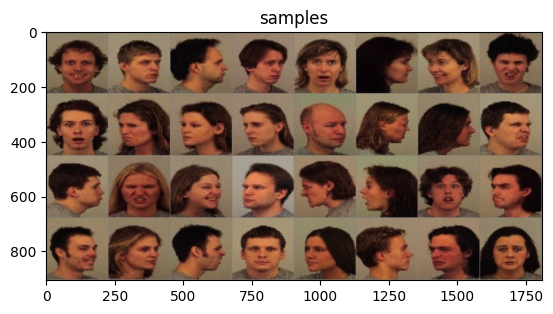

In [8]:
def imshow(inp, title=None):
    """Imshow for Tensor."""
    inp = inp.numpy().transpose((1, 2, 0))
    mean = np.array([0.5, 0.5, 0.5])
    std = np.array([0.5, 0.5, 0.5])
    inp = std * inp + mean
    inp = np.clip(inp, 0, 1)
    plt.imshow(inp)
    if title is not None:
        plt.title(title)
    plt.pause(0.001)  # pause a bit so that plots are updated


# Get a batch of training data
inputs, classes = next(iter(dataloaders['train']))

# Make a grid from batch
out = torchvision.utils.make_grid(inputs)

imshow(out, title='samples')

Training the model
------------------

Now, let's write a general function to train a model. Here, we will
illustrate:

-  Scheduling the learning rate
-  Saving the best model

In the following, parameter ``scheduler`` is an LR scheduler object from
``torch.optim.lr_scheduler``.



In [9]:
from tqdm import tqdm

def train_model(model, criterion, optimizer, scheduler, dataloaders, writer=None, i=0,  num_epochs=25):
    since = time.time()

    best_model_wts = copy.deepcopy(model.state_dict())
    best_acc = 0.0

    for epoch in range(num_epochs):
        print('Epoch {}/{}'.format(epoch, num_epochs - 1))
        print('-' * 10)

        # Each epoch has a training and validation phase
        for phase in ['train', 'val']:
            if phase == 'train':
                scheduler.step()
                model.train()  # Set model to training mode
            else:
                model.eval()   # Set model to evaluate mode

            running_loss = 0.0
            running_corrects = 0

            # Iterate over data.
            for inputs, labels in tqdm(dataloaders[phase]):
                inputs = inputs.to(device)
                labels = labels.to(device)

                # zero the parameter gradients
                optimizer.zero_grad()

                # forward
                # track history if only in train
                with torch.set_grad_enabled(phase == 'train'):
                    outputs = model(inputs)
                    _, preds = torch.max(outputs, 1)
                    loss = criterion(outputs, labels)

                    # backward + optimize only if in training phase
                    if phase == 'train':
                        loss.backward()
                        optimizer.step()

                # statistics
                running_loss += loss.item() * inputs.size(0)
                running_corrects += torch.sum(preds == labels.data)

            epoch_loss = running_loss / dataset_sizes[phase]
            epoch_acc = running_corrects.double() / dataset_sizes[phase]

            print('{} Loss: {:.4f} Acc: {:.4f}'.format(
                phase, epoch_loss, epoch_acc))


            writer.add_scalar(phase+"/loss", epoch_loss, epoch)
            writer.add_scalar(phase+"/acc", epoch_acc, epoch)


            # deep copy the model
            if phase == 'val' and epoch_acc > best_acc:
                best_acc = epoch_acc
                best_model_wts = copy.deepcopy(model.state_dict())
                torch.save(model.state_dict(), 'saved/resnet_'+str(i)+'.pt')

        print()


    time_elapsed = time.time() - since
    print('Training complete in {:.0f}m {:.0f}s'.format(
        time_elapsed // 60, time_elapsed % 60))
    print('Best val Acc: {:4f}'.format(best_acc))

    # load best model weights
    model.load_state_dict(best_model_wts)
    return model, best_acc

Visualizing the model predictions

In [10]:
import imageio
import os
import matplotlib.pyplot as plt
from PIL import Image, ImageDraw, ImageFont

def visualize_model_misclassified(model, dataloader, class_names, save_dir='misclassified', num_images=15, columns=3):
    os.makedirs(save_dir, exist_ok=True)
    was_training = model.training
    model.eval()
    images_so_far = 0
    rows = (num_images + columns - 1) // columns
    fig, axes = plt.subplots(rows, columns, figsize=(columns * 4, rows * 4))
    axes = axes.flatten()

    with torch.no_grad():
        for inputs, labels in dataloader:
            inputs = inputs.to(device)
            labels = labels.to(device)

            outputs = model(inputs)
            _, preds = torch.max(outputs, 1)

            for j in range(inputs.size()[0]):
                if preds[j] != labels[j]:
                    if images_so_far >= num_images:
                        break

                    # --- Display in grid ---
                    ax = axes[images_so_far]
                    ax.axis('off')
                    ax.set_title(f'Pred: {class_names[int(preds[j])]},\nTrue: {class_names[int(labels[j])]}', fontsize=9)
                    imshow(inputs.cpu().data[j], ax=ax)

                    # --- Save image with overlay text ---
                    img = inputs[j].cpu().numpy().transpose(1, 2, 0)
                    img = (img * 0.5 + 0.5) * 255
                    img = img.astype(np.uint8)
                    img_pil = Image.fromarray(img)

                    draw = ImageDraw.Draw(img_pil)
                    font = ImageFont.load_default()
                    text = f'Predicted: {class_names[int(preds[j])]} | True: {class_names[int(labels[j])]}'
                    draw.rectangle([10, 10, 280, 25], fill=(255, 255, 255))
                    draw.text((10, 10), text, font=font, fill=(0, 0, 0))

                    img_pil.save(f'{save_dir}/misclassified_{images_so_far + 1}.jpg')

                    images_so_far += 1

    for k in range(images_so_far, len(axes)):
        axes[k].axis('off')

    plt.tight_layout()
    plt.show()
    model.train(mode=was_training)


def imshow(inp, ax=None, title=None):
    inp = inp.numpy().transpose((1, 2, 0))
    mean = np.array([0.5, 0.5, 0.5])
    std = np.array([0.5, 0.5, 0.5])
    inp = std * inp + mean
    inp = np.clip(inp, 0, 1)
    if ax is None:
        plt.imshow(inp)
    else:
        ax.imshow(inp)
    if title is not None:
        ax.set_title(title)


Finetuning the convnet
----------------------

Load a pretrained model and reset final fully connected layer.




Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth
100%|██████████| 44.7M/44.7M [00:00<00:00, 148MB/s]
/usr/local/lib/python3.11/dist-packages/torch/optim/lr_scheduler.py:227: UserWarning: Detected call of `lr_scheduler.step()` before `optimizer.step()`. In PyTorch 1.1.0 and later, you should call them in the opposite order: `optimizer.step()` before `lr_scheduler.step()`.  Failure to do this will result in PyTorch skipping the first value of the learning rate schedule. See more details at https://pytorch.org/docs/stable/optim.html#how-to-adjust-learning-rate
  warnings.warn(


Epoch 0/19
----------


100%|██████████| 138/138 [00:11<00:00, 12.33it/s]


train Loss: 1.7127 Acc: 0.3209


100%|██████████| 16/16 [00:00<00:00, 17.54it/s]


val Loss: 1.3547 Acc: 0.4857

Epoch 1/19
----------


100%|██████████| 138/138 [00:09<00:00, 14.85it/s]


train Loss: 1.0021 Acc: 0.6227


100%|██████████| 16/16 [00:00<00:00, 20.37it/s]


val Loss: 0.8646 Acc: 0.6837

Epoch 2/19
----------


100%|██████████| 138/138 [00:09<00:00, 14.82it/s]


train Loss: 0.6677 Acc: 0.7571


100%|██████████| 16/16 [00:00<00:00, 20.52it/s]


val Loss: 0.6488 Acc: 0.7551

Epoch 3/19
----------


100%|██████████| 138/138 [00:09<00:00, 15.30it/s]


train Loss: 0.4823 Acc: 0.8317


100%|██████████| 16/16 [00:00<00:00, 20.01it/s]


val Loss: 0.5625 Acc: 0.7959

Epoch 4/19
----------


100%|██████████| 138/138 [00:09<00:00, 15.20it/s]


train Loss: 0.3647 Acc: 0.8789


100%|██████████| 16/16 [00:00<00:00, 20.37it/s]


val Loss: 0.5164 Acc: 0.8224

Epoch 5/19
----------


100%|██████████| 138/138 [00:09<00:00, 15.03it/s]


train Loss: 0.2317 Acc: 0.9336


100%|██████████| 16/16 [00:00<00:00, 20.26it/s]


val Loss: 0.4221 Acc: 0.8306

Epoch 6/19
----------


100%|██████████| 138/138 [00:09<00:00, 14.82it/s]


train Loss: 0.1994 Acc: 0.9460


100%|██████████| 16/16 [00:00<00:00, 20.14it/s]


val Loss: 0.4141 Acc: 0.8490

Epoch 7/19
----------


100%|██████████| 138/138 [00:09<00:00, 15.18it/s]


train Loss: 0.1890 Acc: 0.9517


100%|██████████| 16/16 [00:00<00:00, 19.64it/s]


val Loss: 0.4231 Acc: 0.8531

Epoch 8/19
----------


100%|██████████| 138/138 [00:09<00:00, 15.15it/s]


train Loss: 0.1764 Acc: 0.9556


100%|██████████| 16/16 [00:00<00:00, 18.16it/s]


val Loss: 0.4086 Acc: 0.8531

Epoch 9/19
----------


100%|██████████| 138/138 [00:09<00:00, 15.00it/s]


train Loss: 0.1736 Acc: 0.9522


100%|██████████| 16/16 [00:00<00:00, 19.60it/s]


val Loss: 0.4119 Acc: 0.8490

Epoch 10/19
----------


100%|██████████| 138/138 [00:09<00:00, 15.14it/s]


train Loss: 0.1548 Acc: 0.9615


100%|██████████| 16/16 [00:00<00:00, 19.71it/s]


val Loss: 0.3998 Acc: 0.8531

Epoch 11/19
----------


100%|██████████| 138/138 [00:09<00:00, 15.02it/s]


train Loss: 0.1520 Acc: 0.9617


100%|██████████| 16/16 [00:00<00:00, 19.85it/s]


val Loss: 0.3922 Acc: 0.8551

Epoch 12/19
----------


100%|██████████| 138/138 [00:09<00:00, 15.04it/s]


train Loss: 0.1480 Acc: 0.9637


100%|██████████| 16/16 [00:00<00:00, 20.25it/s]


val Loss: 0.3950 Acc: 0.8531

Epoch 13/19
----------


100%|██████████| 138/138 [00:09<00:00, 15.06it/s]


train Loss: 0.1532 Acc: 0.9642


100%|██████████| 16/16 [00:00<00:00, 20.76it/s]


val Loss: 0.4007 Acc: 0.8592

Epoch 14/19
----------


100%|██████████| 138/138 [00:09<00:00, 15.08it/s]


train Loss: 0.1506 Acc: 0.9612


100%|██████████| 16/16 [00:00<00:00, 20.54it/s]


val Loss: 0.3932 Acc: 0.8449

Epoch 15/19
----------


100%|██████████| 138/138 [00:09<00:00, 15.07it/s]


train Loss: 0.1491 Acc: 0.9646


100%|██████████| 16/16 [00:00<00:00, 19.43it/s]


val Loss: 0.4024 Acc: 0.8551

Epoch 16/19
----------


100%|██████████| 138/138 [00:09<00:00, 15.23it/s]


train Loss: 0.1430 Acc: 0.9673


100%|██████████| 16/16 [00:00<00:00, 20.34it/s]


val Loss: 0.3969 Acc: 0.8592

Epoch 17/19
----------


100%|██████████| 138/138 [00:09<00:00, 14.90it/s]


train Loss: 0.1461 Acc: 0.9658


100%|██████████| 16/16 [00:00<00:00, 20.25it/s]


val Loss: 0.3981 Acc: 0.8469

Epoch 18/19
----------


100%|██████████| 138/138 [00:09<00:00, 15.03it/s]


train Loss: 0.1378 Acc: 0.9671


100%|██████████| 16/16 [00:00<00:00, 19.41it/s]


val Loss: 0.3964 Acc: 0.8592

Epoch 19/19
----------


100%|██████████| 138/138 [00:09<00:00, 14.92it/s]


train Loss: 0.1481 Acc: 0.9626


100%|██████████| 16/16 [00:00<00:00, 20.20it/s]


val Loss: 0.3933 Acc: 0.8592

Training complete in 3m 23s
Best val Acc: 0.859184
Showing misclassified examples for fold 0...


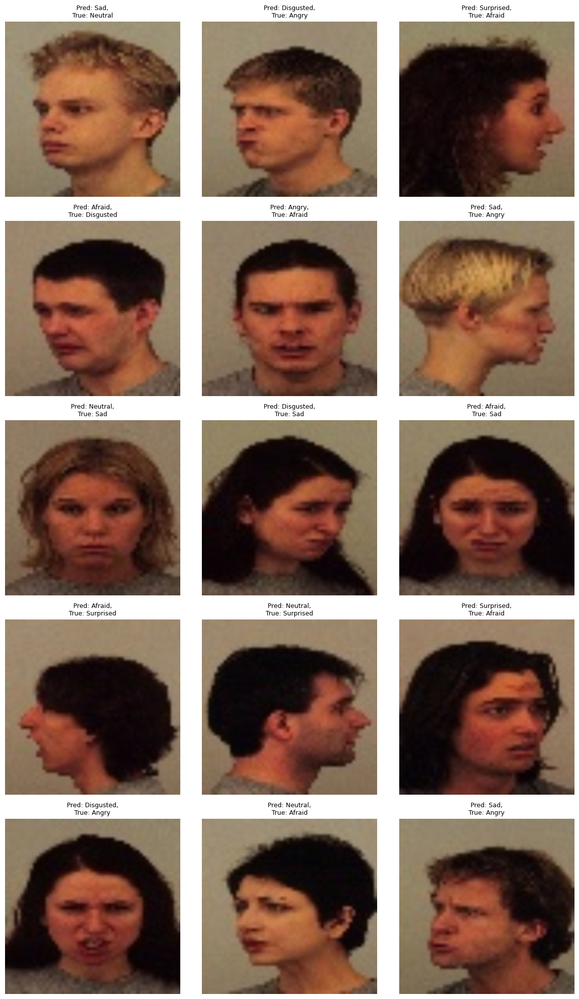




------------------------------------
 Accuracies  [0.8591836734693878]



Epoch 0/19
----------


100%|██████████| 138/138 [00:09<00:00, 14.90it/s]


train Loss: 1.7042 Acc: 0.3204


100%|██████████| 16/16 [00:00<00:00, 19.60it/s]


val Loss: 1.2087 Acc: 0.5714

Epoch 1/19
----------


100%|██████████| 138/138 [00:09<00:00, 14.79it/s]


train Loss: 0.9668 Acc: 0.6449


100%|██████████| 16/16 [00:00<00:00, 19.74it/s]


val Loss: 0.7780 Acc: 0.7184

Epoch 2/19
----------


100%|██████████| 138/138 [00:09<00:00, 14.70it/s]


train Loss: 0.6435 Acc: 0.7685


100%|██████████| 16/16 [00:00<00:00, 19.13it/s]


val Loss: 0.6246 Acc: 0.7796

Epoch 3/19
----------


100%|██████████| 138/138 [00:09<00:00, 14.72it/s]


train Loss: 0.4714 Acc: 0.8329


100%|██████████| 16/16 [00:00<00:00, 19.12it/s]


val Loss: 0.5023 Acc: 0.8143

Epoch 4/19
----------


100%|██████████| 138/138 [00:09<00:00, 14.86it/s]


train Loss: 0.3446 Acc: 0.8823


100%|██████████| 16/16 [00:00<00:00, 20.10it/s]


val Loss: 0.4046 Acc: 0.8327

Epoch 5/19
----------


100%|██████████| 138/138 [00:09<00:00, 14.81it/s]


train Loss: 0.2274 Acc: 0.9349


100%|██████████| 16/16 [00:00<00:00, 19.99it/s]


val Loss: 0.3403 Acc: 0.8673

Epoch 6/19
----------


100%|██████████| 138/138 [00:09<00:00, 14.73it/s]


train Loss: 0.1964 Acc: 0.9456


100%|██████████| 16/16 [00:00<00:00, 19.06it/s]


val Loss: 0.3279 Acc: 0.8776

Epoch 7/19
----------


100%|██████████| 138/138 [00:09<00:00, 15.02it/s]


train Loss: 0.1843 Acc: 0.9508


100%|██████████| 16/16 [00:00<00:00, 19.37it/s]


val Loss: 0.3326 Acc: 0.8857

Epoch 8/19
----------


100%|██████████| 138/138 [00:09<00:00, 14.73it/s]


train Loss: 0.1822 Acc: 0.9537


100%|██████████| 16/16 [00:00<00:00, 19.88it/s]


val Loss: 0.3185 Acc: 0.8816

Epoch 9/19
----------


100%|██████████| 138/138 [00:09<00:00, 14.65it/s]


train Loss: 0.1715 Acc: 0.9542


100%|██████████| 16/16 [00:00<00:00, 19.98it/s]


val Loss: 0.3188 Acc: 0.8796

Epoch 10/19
----------


100%|██████████| 138/138 [00:09<00:00, 14.69it/s]


train Loss: 0.1599 Acc: 0.9576


100%|██████████| 16/16 [00:00<00:00, 19.36it/s]


val Loss: 0.3178 Acc: 0.8796

Epoch 11/19
----------


100%|██████████| 138/138 [00:09<00:00, 14.69it/s]


train Loss: 0.1557 Acc: 0.9612


100%|██████████| 16/16 [00:00<00:00, 19.80it/s]


val Loss: 0.3151 Acc: 0.8878

Epoch 12/19
----------


100%|██████████| 138/138 [00:09<00:00, 14.70it/s]


train Loss: 0.1500 Acc: 0.9619


100%|██████████| 16/16 [00:00<00:00, 18.56it/s]


val Loss: 0.3107 Acc: 0.8939

Epoch 13/19
----------


100%|██████████| 138/138 [00:09<00:00, 14.54it/s]


train Loss: 0.1371 Acc: 0.9712


100%|██████████| 16/16 [00:00<00:00, 20.19it/s]


val Loss: 0.3107 Acc: 0.8878

Epoch 14/19
----------


100%|██████████| 138/138 [00:09<00:00, 14.69it/s]


train Loss: 0.1421 Acc: 0.9644


100%|██████████| 16/16 [00:00<00:00, 19.69it/s]


val Loss: 0.3116 Acc: 0.8837

Epoch 15/19
----------


100%|██████████| 138/138 [00:09<00:00, 14.82it/s]


train Loss: 0.1357 Acc: 0.9696


100%|██████████| 16/16 [00:00<00:00, 17.66it/s]


val Loss: 0.3147 Acc: 0.8816

Epoch 16/19
----------


100%|██████████| 138/138 [00:09<00:00, 14.95it/s]


train Loss: 0.1483 Acc: 0.9651


100%|██████████| 16/16 [00:00<00:00, 19.42it/s]


val Loss: 0.3151 Acc: 0.8837

Epoch 17/19
----------


100%|██████████| 138/138 [00:09<00:00, 14.61it/s]


train Loss: 0.1388 Acc: 0.9673


100%|██████████| 16/16 [00:00<00:00, 20.03it/s]


val Loss: 0.3113 Acc: 0.8918

Epoch 18/19
----------


100%|██████████| 138/138 [00:09<00:00, 14.71it/s]


train Loss: 0.1385 Acc: 0.9687


100%|██████████| 16/16 [00:00<00:00, 19.14it/s]


val Loss: 0.3080 Acc: 0.8898

Epoch 19/19
----------


100%|██████████| 138/138 [00:09<00:00, 14.56it/s]


train Loss: 0.1467 Acc: 0.9649


100%|██████████| 16/16 [00:00<00:00, 19.03it/s]


val Loss: 0.3106 Acc: 0.8918

Training complete in 3m 25s
Best val Acc: 0.893878
Showing misclassified examples for fold 1...


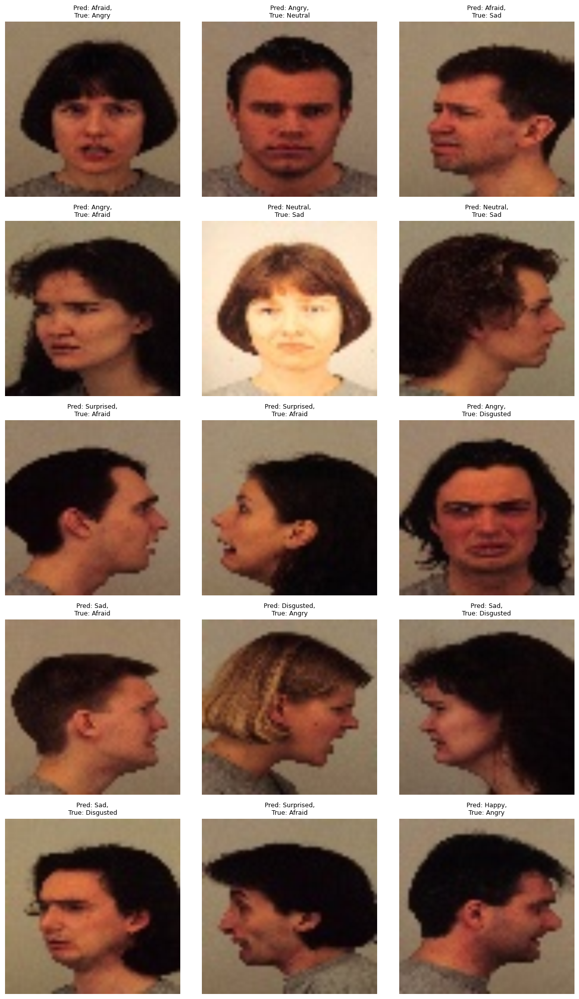




------------------------------------
 Accuracies  [0.8591836734693878, 0.8938775510204082]



Epoch 0/19
----------


100%|██████████| 138/138 [00:09<00:00, 14.46it/s]


train Loss: 1.6896 Acc: 0.3397


100%|██████████| 16/16 [00:00<00:00, 18.68it/s]


val Loss: 1.1791 Acc: 0.5469

Epoch 1/19
----------


100%|██████████| 138/138 [00:09<00:00, 14.64it/s]


train Loss: 0.8937 Acc: 0.6730


100%|██████████| 16/16 [00:00<00:00, 18.77it/s]


val Loss: 0.8348 Acc: 0.6816

Epoch 2/19
----------


100%|██████████| 138/138 [00:09<00:00, 14.48it/s]


train Loss: 0.5793 Acc: 0.7907


100%|██████████| 16/16 [00:00<00:00, 19.92it/s]


val Loss: 0.6695 Acc: 0.7449

Epoch 3/19
----------


100%|██████████| 138/138 [00:09<00:00, 14.68it/s]


train Loss: 0.4130 Acc: 0.8510


100%|██████████| 16/16 [00:00<00:00, 19.96it/s]


val Loss: 0.5664 Acc: 0.7980

Epoch 4/19
----------


100%|██████████| 138/138 [00:09<00:00, 14.38it/s]


train Loss: 0.3263 Acc: 0.8925


100%|██████████| 16/16 [00:00<00:00, 18.47it/s]


val Loss: 0.5636 Acc: 0.7959

Epoch 5/19
----------


100%|██████████| 138/138 [00:09<00:00, 14.50it/s]


train Loss: 0.2106 Acc: 0.9383


100%|██████████| 16/16 [00:00<00:00, 20.02it/s]


val Loss: 0.4509 Acc: 0.8469

Epoch 6/19
----------


100%|██████████| 138/138 [00:09<00:00, 14.42it/s]


train Loss: 0.1758 Acc: 0.9542


100%|██████████| 16/16 [00:00<00:00, 19.10it/s]


val Loss: 0.4438 Acc: 0.8347

Epoch 7/19
----------


100%|██████████| 138/138 [00:09<00:00, 14.36it/s]


train Loss: 0.1649 Acc: 0.9560


100%|██████████| 16/16 [00:00<00:00, 19.14it/s]


val Loss: 0.4536 Acc: 0.8429

Epoch 8/19
----------


100%|██████████| 138/138 [00:09<00:00, 14.76it/s]


train Loss: 0.1583 Acc: 0.9610


100%|██████████| 16/16 [00:00<00:00, 17.45it/s]


val Loss: 0.4407 Acc: 0.8408

Epoch 9/19
----------


100%|██████████| 138/138 [00:09<00:00, 14.17it/s]


train Loss: 0.1549 Acc: 0.9633


100%|██████████| 16/16 [00:00<00:00, 18.41it/s]


val Loss: 0.4476 Acc: 0.8347

Epoch 10/19
----------


100%|██████████| 138/138 [00:09<00:00, 14.30it/s]


train Loss: 0.1476 Acc: 0.9617


100%|██████████| 16/16 [00:00<00:00, 19.40it/s]


val Loss: 0.4610 Acc: 0.8388

Epoch 11/19
----------


100%|██████████| 138/138 [00:09<00:00, 14.32it/s]


train Loss: 0.1336 Acc: 0.9685


100%|██████████| 16/16 [00:00<00:00, 19.24it/s]


val Loss: 0.4489 Acc: 0.8429

Epoch 12/19
----------


100%|██████████| 138/138 [00:09<00:00, 14.52it/s]


train Loss: 0.1327 Acc: 0.9735


100%|██████████| 16/16 [00:00<00:00, 20.25it/s]


val Loss: 0.4351 Acc: 0.8429

Epoch 13/19
----------


100%|██████████| 138/138 [00:09<00:00, 14.41it/s]


train Loss: 0.1306 Acc: 0.9710


100%|██████████| 16/16 [00:00<00:00, 19.79it/s]


val Loss: 0.4414 Acc: 0.8388

Epoch 14/19
----------


100%|██████████| 138/138 [00:09<00:00, 14.46it/s]


train Loss: 0.1287 Acc: 0.9710


100%|██████████| 16/16 [00:00<00:00, 19.93it/s]


val Loss: 0.4391 Acc: 0.8469

Epoch 15/19
----------


100%|██████████| 138/138 [00:09<00:00, 14.50it/s]


train Loss: 0.1302 Acc: 0.9703


100%|██████████| 16/16 [00:00<00:00, 19.05it/s]


val Loss: 0.4365 Acc: 0.8469

Epoch 16/19
----------


100%|██████████| 138/138 [00:09<00:00, 14.70it/s]


train Loss: 0.1288 Acc: 0.9712


100%|██████████| 16/16 [00:00<00:00, 18.84it/s]


val Loss: 0.4404 Acc: 0.8429

Epoch 17/19
----------


100%|██████████| 138/138 [00:09<00:00, 14.75it/s]


train Loss: 0.1291 Acc: 0.9710


100%|██████████| 16/16 [00:00<00:00, 18.36it/s]


val Loss: 0.4369 Acc: 0.8408

Epoch 18/19
----------


100%|██████████| 138/138 [00:09<00:00, 14.53it/s]


train Loss: 0.1215 Acc: 0.9753


100%|██████████| 16/16 [00:00<00:00, 17.62it/s]


val Loss: 0.4403 Acc: 0.8408

Epoch 19/19
----------


100%|██████████| 138/138 [00:09<00:00, 14.54it/s]


train Loss: 0.1251 Acc: 0.9730


100%|██████████| 16/16 [00:00<00:00, 18.82it/s]


val Loss: 0.4385 Acc: 0.8408

Training complete in 3m 28s
Best val Acc: 0.846939
Showing misclassified examples for fold 2...


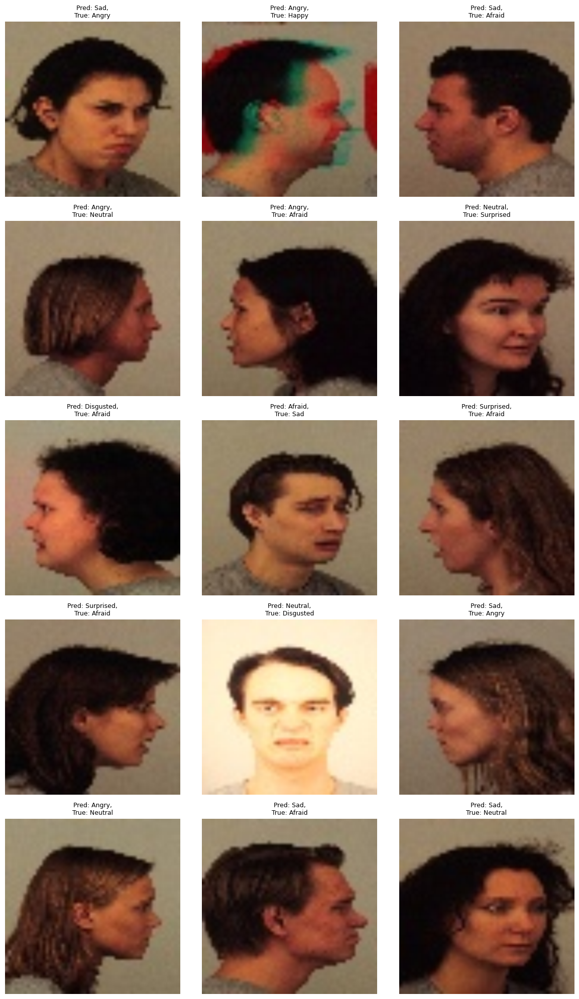




------------------------------------
 Accuracies  [0.8591836734693878, 0.8938775510204082, 0.8469387755102041]



Epoch 0/19
----------


100%|██████████| 138/138 [00:09<00:00, 14.48it/s]


train Loss: 1.6963 Acc: 0.3349


100%|██████████| 16/16 [00:00<00:00, 19.57it/s]


val Loss: 1.2605 Acc: 0.5245

Epoch 1/19
----------


100%|██████████| 138/138 [00:09<00:00, 14.62it/s]


train Loss: 0.9532 Acc: 0.6531


100%|██████████| 16/16 [00:00<00:00, 19.81it/s]


val Loss: 0.8019 Acc: 0.6939

Epoch 2/19
----------


100%|██████████| 138/138 [00:09<00:00, 14.50it/s]


train Loss: 0.6280 Acc: 0.7760


100%|██████████| 16/16 [00:00<00:00, 20.03it/s]


val Loss: 0.6231 Acc: 0.7714

Epoch 3/19
----------


100%|██████████| 138/138 [00:09<00:00, 14.31it/s]


train Loss: 0.4657 Acc: 0.8381


100%|██████████| 16/16 [00:00<00:00, 18.94it/s]


val Loss: 0.5182 Acc: 0.8082

Epoch 4/19
----------


100%|██████████| 138/138 [00:09<00:00, 14.53it/s]


train Loss: 0.3376 Acc: 0.8878


100%|██████████| 16/16 [00:00<00:00, 19.29it/s]


val Loss: 0.5099 Acc: 0.8224

Epoch 5/19
----------


100%|██████████| 138/138 [00:09<00:00, 14.37it/s]


train Loss: 0.2300 Acc: 0.9329


100%|██████████| 16/16 [00:00<00:00, 18.97it/s]


val Loss: 0.3685 Acc: 0.8816

Epoch 6/19
----------


100%|██████████| 138/138 [00:09<00:00, 14.53it/s]


train Loss: 0.2081 Acc: 0.9420


100%|██████████| 16/16 [00:00<00:00, 19.85it/s]


val Loss: 0.3596 Acc: 0.8714

Epoch 7/19
----------


100%|██████████| 138/138 [00:09<00:00, 14.52it/s]


train Loss: 0.1847 Acc: 0.9501


100%|██████████| 16/16 [00:00<00:00, 19.55it/s]


val Loss: 0.3612 Acc: 0.8796

Epoch 8/19
----------


100%|██████████| 138/138 [00:09<00:00, 14.43it/s]


train Loss: 0.1735 Acc: 0.9546


100%|██████████| 16/16 [00:00<00:00, 18.45it/s]


val Loss: 0.3524 Acc: 0.8837

Epoch 9/19
----------


100%|██████████| 138/138 [00:09<00:00, 14.67it/s]


train Loss: 0.1649 Acc: 0.9590


100%|██████████| 16/16 [00:00<00:00, 18.55it/s]


val Loss: 0.3453 Acc: 0.8918

Epoch 10/19
----------


100%|██████████| 138/138 [00:09<00:00, 14.84it/s]


train Loss: 0.1569 Acc: 0.9601


100%|██████████| 16/16 [00:00<00:00, 18.77it/s]


val Loss: 0.3388 Acc: 0.8898

Epoch 11/19
----------


100%|██████████| 138/138 [00:09<00:00, 14.59it/s]


train Loss: 0.1446 Acc: 0.9705


100%|██████████| 16/16 [00:00<00:00, 19.58it/s]


val Loss: 0.3403 Acc: 0.8959

Epoch 12/19
----------


100%|██████████| 138/138 [00:09<00:00, 14.61it/s]


train Loss: 0.1435 Acc: 0.9667


100%|██████████| 16/16 [00:00<00:00, 19.00it/s]


val Loss: 0.3393 Acc: 0.8918

Epoch 13/19
----------


100%|██████████| 138/138 [00:09<00:00, 14.58it/s]


train Loss: 0.1419 Acc: 0.9658


100%|██████████| 16/16 [00:00<00:00, 19.97it/s]


val Loss: 0.3358 Acc: 0.8959

Epoch 14/19
----------


100%|██████████| 138/138 [00:09<00:00, 14.45it/s]


train Loss: 0.1383 Acc: 0.9689


100%|██████████| 16/16 [00:00<00:00, 17.87it/s]


val Loss: 0.3364 Acc: 0.8939

Epoch 15/19
----------


100%|██████████| 138/138 [00:09<00:00, 14.46it/s]


train Loss: 0.1389 Acc: 0.9683


100%|██████████| 16/16 [00:00<00:00, 19.85it/s]


val Loss: 0.3422 Acc: 0.8837

Epoch 16/19
----------


100%|██████████| 138/138 [00:09<00:00, 14.43it/s]


train Loss: 0.1365 Acc: 0.9703


100%|██████████| 16/16 [00:00<00:00, 19.83it/s]


val Loss: 0.3343 Acc: 0.8939

Epoch 17/19
----------


100%|██████████| 138/138 [00:09<00:00, 14.46it/s]


train Loss: 0.1335 Acc: 0.9696


100%|██████████| 16/16 [00:00<00:00, 18.43it/s]


val Loss: 0.3368 Acc: 0.8918

Epoch 18/19
----------


100%|██████████| 138/138 [00:09<00:00, 14.22it/s]


train Loss: 0.1372 Acc: 0.9705


100%|██████████| 16/16 [00:00<00:00, 18.62it/s]


val Loss: 0.3353 Acc: 0.8939

Epoch 19/19
----------


100%|██████████| 138/138 [00:09<00:00, 14.59it/s]


train Loss: 0.1396 Acc: 0.9685


100%|██████████| 16/16 [00:00<00:00, 17.95it/s]


val Loss: 0.3364 Acc: 0.8878

Training complete in 3m 28s
Best val Acc: 0.895918
Showing misclassified examples for fold 3...


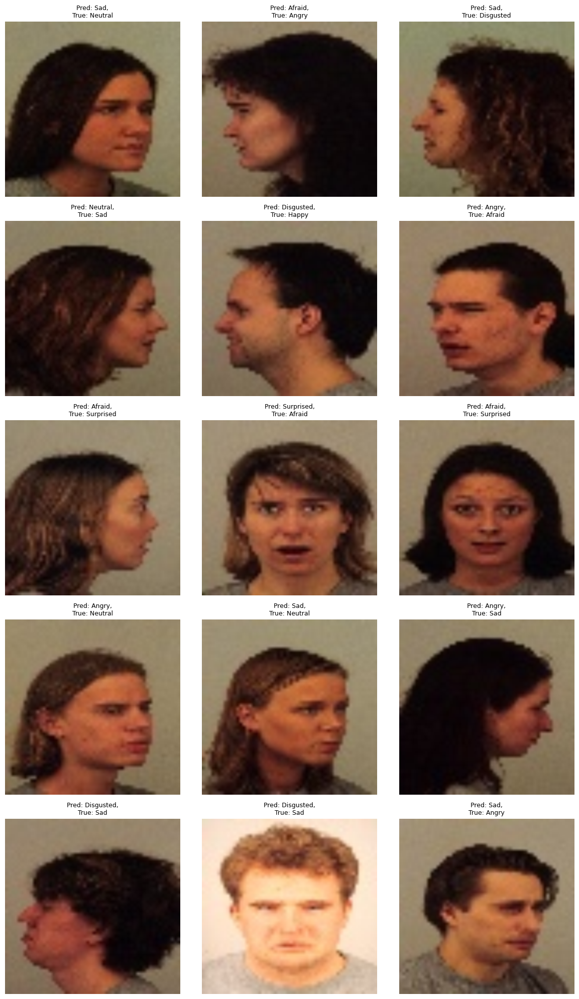




------------------------------------
 Accuracies  [0.8591836734693878, 0.8938775510204082, 0.8469387755102041, 0.8959183673469389]



Epoch 0/19
----------


100%|██████████| 138/138 [00:09<00:00, 14.33it/s]


train Loss: 1.6803 Acc: 0.3404


100%|██████████| 16/16 [00:00<00:00, 19.21it/s]


val Loss: 1.2303 Acc: 0.5388

Epoch 1/19
----------


100%|██████████| 138/138 [00:09<00:00, 14.17it/s]


train Loss: 0.9343 Acc: 0.6578


100%|██████████| 16/16 [00:00<00:00, 19.53it/s]


val Loss: 0.7746 Acc: 0.7204

Epoch 2/19
----------


100%|██████████| 138/138 [00:09<00:00, 14.12it/s]


train Loss: 0.6367 Acc: 0.7667


100%|██████████| 16/16 [00:00<00:00, 18.88it/s]


val Loss: 0.7476 Acc: 0.6980

Epoch 3/19
----------


100%|██████████| 138/138 [00:09<00:00, 14.35it/s]


train Loss: 0.4639 Acc: 0.8383


100%|██████████| 16/16 [00:00<00:00, 17.98it/s]


val Loss: 0.4776 Acc: 0.8490

Epoch 4/19
----------


100%|██████████| 138/138 [00:09<00:00, 14.41it/s]


train Loss: 0.3306 Acc: 0.8934


100%|██████████| 16/16 [00:00<00:00, 18.87it/s]


val Loss: 0.5391 Acc: 0.8082

Epoch 5/19
----------


100%|██████████| 138/138 [00:09<00:00, 14.20it/s]


train Loss: 0.2239 Acc: 0.9331


100%|██████████| 16/16 [00:00<00:00, 18.07it/s]


val Loss: 0.3438 Acc: 0.8673

Epoch 6/19
----------


100%|██████████| 138/138 [00:09<00:00, 14.10it/s]


train Loss: 0.1869 Acc: 0.9537


100%|██████████| 16/16 [00:00<00:00, 19.75it/s]


val Loss: 0.3350 Acc: 0.8735

Epoch 7/19
----------


100%|██████████| 138/138 [00:09<00:00, 14.45it/s]


train Loss: 0.1821 Acc: 0.9522


100%|██████████| 16/16 [00:00<00:00, 19.38it/s]


val Loss: 0.3289 Acc: 0.8796

Epoch 8/19
----------


100%|██████████| 138/138 [00:09<00:00, 14.06it/s]


train Loss: 0.1718 Acc: 0.9553


100%|██████████| 16/16 [00:00<00:00, 18.45it/s]


val Loss: 0.3241 Acc: 0.8857

Epoch 9/19
----------


100%|██████████| 138/138 [00:09<00:00, 14.62it/s]


train Loss: 0.1491 Acc: 0.9637


100%|██████████| 16/16 [00:00<00:00, 19.88it/s]


val Loss: 0.3143 Acc: 0.8837

Epoch 10/19
----------


100%|██████████| 138/138 [00:09<00:00, 14.40it/s]


train Loss: 0.1495 Acc: 0.9639


100%|██████████| 16/16 [00:00<00:00, 19.34it/s]


val Loss: 0.3123 Acc: 0.8939

Epoch 11/19
----------


100%|██████████| 138/138 [00:09<00:00, 14.44it/s]


train Loss: 0.1390 Acc: 0.9694


100%|██████████| 16/16 [00:00<00:00, 19.00it/s]


val Loss: 0.3134 Acc: 0.8918

Epoch 12/19
----------


100%|██████████| 138/138 [00:09<00:00, 14.15it/s]


train Loss: 0.1358 Acc: 0.9683


100%|██████████| 16/16 [00:00<00:00, 19.92it/s]


val Loss: 0.3129 Acc: 0.8837

Epoch 13/19
----------


100%|██████████| 138/138 [00:09<00:00, 14.67it/s]


train Loss: 0.1391 Acc: 0.9721


100%|██████████| 16/16 [00:00<00:00, 17.66it/s]


val Loss: 0.3150 Acc: 0.8796

Epoch 14/19
----------


100%|██████████| 138/138 [00:09<00:00, 14.46it/s]


train Loss: 0.1336 Acc: 0.9723


100%|██████████| 16/16 [00:00<00:00, 19.16it/s]


val Loss: 0.3160 Acc: 0.8816

Epoch 15/19
----------


100%|██████████| 138/138 [00:09<00:00, 14.23it/s]


train Loss: 0.1333 Acc: 0.9712


100%|██████████| 16/16 [00:00<00:00, 18.39it/s]


val Loss: 0.3184 Acc: 0.8796

Epoch 16/19
----------


100%|██████████| 138/138 [00:09<00:00, 14.47it/s]


train Loss: 0.1341 Acc: 0.9694


100%|██████████| 16/16 [00:00<00:00, 19.58it/s]


val Loss: 0.3122 Acc: 0.8878

Epoch 17/19
----------


100%|██████████| 138/138 [00:09<00:00, 14.37it/s]


train Loss: 0.1293 Acc: 0.9730


100%|██████████| 16/16 [00:00<00:00, 18.81it/s]


val Loss: 0.3129 Acc: 0.8878

Epoch 18/19
----------


100%|██████████| 138/138 [00:09<00:00, 14.28it/s]


train Loss: 0.1295 Acc: 0.9717


100%|██████████| 16/16 [00:00<00:00, 18.62it/s]


val Loss: 0.3147 Acc: 0.8857

Epoch 19/19
----------


100%|██████████| 138/138 [00:09<00:00, 14.27it/s]


train Loss: 0.1335 Acc: 0.9683


100%|██████████| 16/16 [00:00<00:00, 19.61it/s]


val Loss: 0.3165 Acc: 0.8837

Training complete in 3m 31s
Best val Acc: 0.893878
Showing misclassified examples for fold 4...


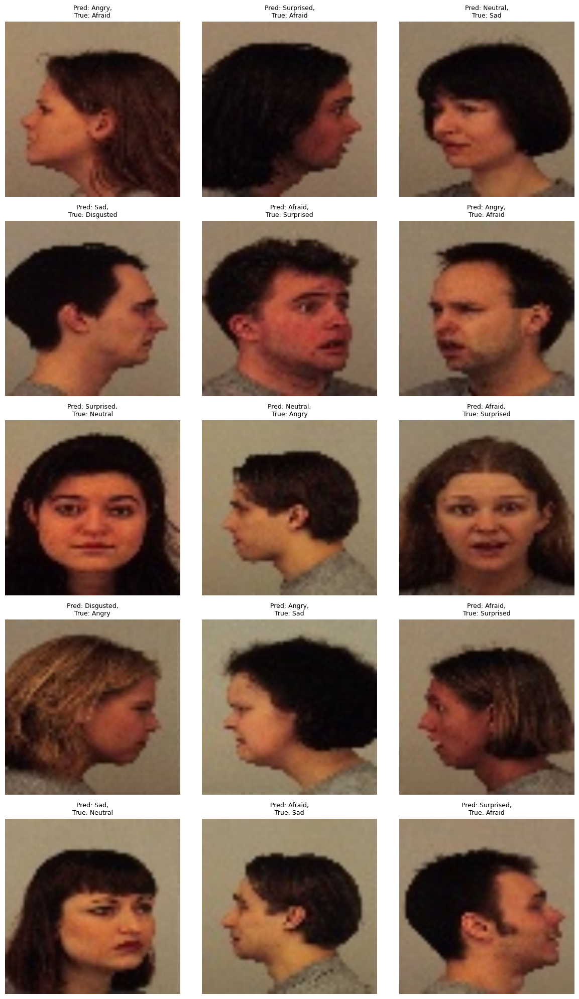




------------------------------------
 Accuracies  [0.8591836734693878, 0.8938775510204082, 0.8469387755102041, 0.8959183673469389, 0.8938775510204082]



Epoch 0/19
----------


100%|██████████| 138/138 [00:09<00:00, 14.33it/s]


train Loss: 1.6669 Acc: 0.3472


100%|██████████| 16/16 [00:00<00:00, 19.46it/s]


val Loss: 1.1557 Acc: 0.5816

Epoch 1/19
----------


100%|██████████| 138/138 [00:09<00:00, 14.27it/s]


train Loss: 0.9156 Acc: 0.6605


100%|██████████| 16/16 [00:00<00:00, 18.42it/s]


val Loss: 0.7346 Acc: 0.7286

Epoch 2/19
----------


100%|██████████| 138/138 [00:09<00:00, 14.55it/s]


train Loss: 0.6046 Acc: 0.7834


100%|██████████| 16/16 [00:00<00:00, 19.29it/s]


val Loss: 0.5802 Acc: 0.7816

Epoch 3/19
----------


100%|██████████| 138/138 [00:09<00:00, 14.09it/s]


train Loss: 0.4310 Acc: 0.8526


100%|██████████| 16/16 [00:00<00:00, 19.58it/s]


val Loss: 0.5217 Acc: 0.8102

Epoch 4/19
----------


100%|██████████| 138/138 [00:09<00:00, 13.90it/s]


train Loss: 0.3200 Acc: 0.8932


100%|██████████| 16/16 [00:00<00:00, 19.82it/s]


val Loss: 0.5012 Acc: 0.8041

Epoch 5/19
----------


100%|██████████| 138/138 [00:09<00:00, 14.31it/s]


train Loss: 0.2095 Acc: 0.9399


100%|██████████| 16/16 [00:00<00:00, 17.58it/s]


val Loss: 0.3836 Acc: 0.8633

Epoch 6/19
----------


100%|██████████| 138/138 [00:09<00:00, 14.18it/s]


train Loss: 0.1775 Acc: 0.9553


100%|██████████| 16/16 [00:00<00:00, 18.80it/s]


val Loss: 0.3679 Acc: 0.8653

Epoch 7/19
----------


100%|██████████| 138/138 [00:09<00:00, 14.15it/s]


train Loss: 0.1761 Acc: 0.9537


100%|██████████| 16/16 [00:00<00:00, 17.96it/s]


val Loss: 0.3705 Acc: 0.8653

Epoch 8/19
----------


100%|██████████| 138/138 [00:09<00:00, 14.25it/s]


train Loss: 0.1657 Acc: 0.9546


100%|██████████| 16/16 [00:00<00:00, 17.66it/s]


val Loss: 0.3703 Acc: 0.8653

Epoch 9/19
----------


100%|██████████| 138/138 [00:09<00:00, 14.29it/s]


train Loss: 0.1503 Acc: 0.9603


100%|██████████| 16/16 [00:00<00:00, 18.69it/s]


val Loss: 0.3638 Acc: 0.8694

Epoch 10/19
----------


100%|██████████| 138/138 [00:09<00:00, 14.00it/s]


train Loss: 0.1476 Acc: 0.9637


100%|██████████| 16/16 [00:00<00:00, 18.67it/s]


val Loss: 0.3505 Acc: 0.8694

Epoch 11/19
----------


100%|██████████| 138/138 [00:09<00:00, 14.20it/s]


train Loss: 0.1410 Acc: 0.9653


100%|██████████| 16/16 [00:00<00:00, 19.77it/s]


val Loss: 0.3548 Acc: 0.8714

Epoch 12/19
----------


100%|██████████| 138/138 [00:09<00:00, 14.06it/s]


train Loss: 0.1346 Acc: 0.9667


100%|██████████| 16/16 [00:00<00:00, 19.61it/s]


val Loss: 0.3476 Acc: 0.8714

Epoch 13/19
----------


100%|██████████| 138/138 [00:09<00:00, 14.14it/s]


train Loss: 0.1345 Acc: 0.9673


100%|██████████| 16/16 [00:00<00:00, 19.58it/s]


val Loss: 0.3501 Acc: 0.8714

Epoch 14/19
----------


100%|██████████| 138/138 [00:09<00:00, 14.11it/s]


train Loss: 0.1350 Acc: 0.9673


100%|██████████| 16/16 [00:00<00:00, 18.67it/s]


val Loss: 0.3557 Acc: 0.8673

Epoch 15/19
----------


100%|██████████| 138/138 [00:09<00:00, 14.00it/s]


train Loss: 0.1362 Acc: 0.9707


100%|██████████| 16/16 [00:00<00:00, 18.57it/s]


val Loss: 0.3516 Acc: 0.8694

Epoch 16/19
----------


100%|██████████| 138/138 [00:09<00:00, 14.38it/s]


train Loss: 0.1343 Acc: 0.9714


100%|██████████| 16/16 [00:00<00:00, 18.38it/s]


val Loss: 0.3505 Acc: 0.8673

Epoch 17/19
----------


100%|██████████| 138/138 [00:09<00:00, 14.21it/s]


train Loss: 0.1262 Acc: 0.9712


100%|██████████| 16/16 [00:00<00:00, 17.99it/s]


val Loss: 0.3528 Acc: 0.8694

Epoch 18/19
----------


100%|██████████| 138/138 [00:09<00:00, 14.19it/s]


train Loss: 0.1330 Acc: 0.9673


100%|██████████| 16/16 [00:00<00:00, 18.71it/s]


val Loss: 0.3528 Acc: 0.8673

Epoch 19/19
----------


100%|██████████| 138/138 [00:09<00:00, 14.06it/s]


train Loss: 0.1289 Acc: 0.9710


100%|██████████| 16/16 [00:00<00:00, 18.53it/s]


val Loss: 0.3512 Acc: 0.8714

Training complete in 3m 33s
Best val Acc: 0.871429
Showing misclassified examples for fold 5...


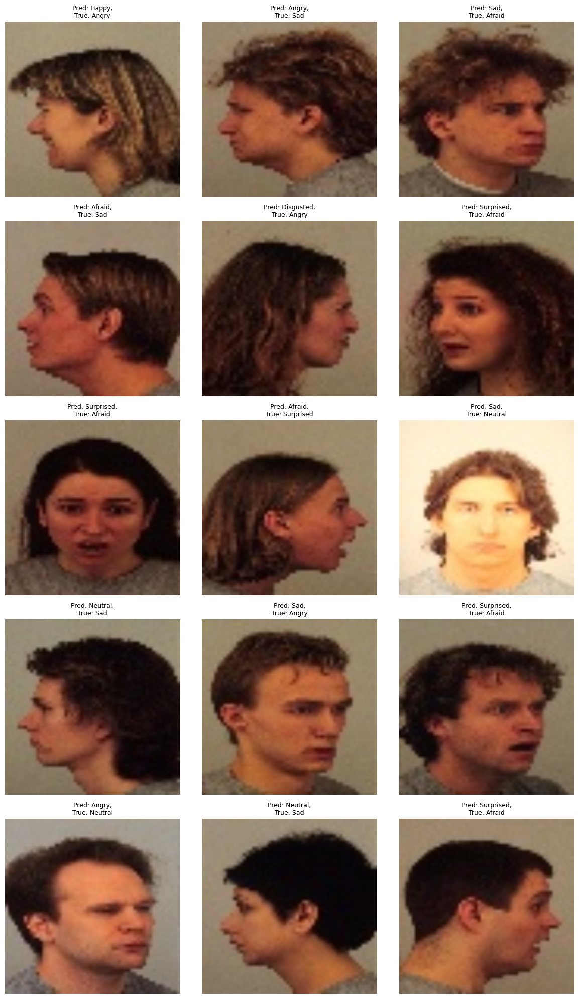




------------------------------------
 Accuracies  [0.8591836734693878, 0.8938775510204082, 0.8469387755102041, 0.8959183673469389, 0.8938775510204082, 0.8714285714285716]



Epoch 0/19
----------


100%|██████████| 138/138 [00:09<00:00, 14.26it/s]


train Loss: 1.7144 Acc: 0.3293


100%|██████████| 16/16 [00:00<00:00, 17.61it/s]


val Loss: 1.2408 Acc: 0.5347

Epoch 1/19
----------


100%|██████████| 138/138 [00:09<00:00, 14.37it/s]


train Loss: 0.9449 Acc: 0.6465


100%|██████████| 16/16 [00:00<00:00, 18.23it/s]


val Loss: 0.8427 Acc: 0.6857

Epoch 2/19
----------


100%|██████████| 138/138 [00:09<00:00, 14.45it/s]


train Loss: 0.6186 Acc: 0.7689


100%|██████████| 16/16 [00:00<00:00, 19.71it/s]


val Loss: 0.7397 Acc: 0.7265

Epoch 3/19
----------


100%|██████████| 138/138 [00:09<00:00, 14.02it/s]


train Loss: 0.4628 Acc: 0.8286


100%|██████████| 16/16 [00:00<00:00, 18.25it/s]


val Loss: 0.5971 Acc: 0.7878

Epoch 4/19
----------


100%|██████████| 138/138 [00:09<00:00, 14.17it/s]


train Loss: 0.3273 Acc: 0.8921


100%|██████████| 16/16 [00:00<00:00, 19.52it/s]


val Loss: 0.5486 Acc: 0.8306

Epoch 5/19
----------


100%|██████████| 138/138 [00:09<00:00, 14.39it/s]


train Loss: 0.2278 Acc: 0.9324


100%|██████████| 16/16 [00:00<00:00, 19.79it/s]


val Loss: 0.4603 Acc: 0.8265

Epoch 6/19
----------


100%|██████████| 138/138 [00:09<00:00, 14.41it/s]


train Loss: 0.1883 Acc: 0.9472


100%|██████████| 16/16 [00:00<00:00, 19.09it/s]


val Loss: 0.4626 Acc: 0.8327

Epoch 7/19
----------


100%|██████████| 138/138 [00:09<00:00, 14.41it/s]


train Loss: 0.1727 Acc: 0.9528


100%|██████████| 16/16 [00:00<00:00, 19.12it/s]


val Loss: 0.4437 Acc: 0.8449

Epoch 8/19
----------


100%|██████████| 138/138 [00:09<00:00, 14.59it/s]


train Loss: 0.1527 Acc: 0.9610


100%|██████████| 16/16 [00:00<00:00, 18.76it/s]


val Loss: 0.4351 Acc: 0.8429

Epoch 9/19
----------


100%|██████████| 138/138 [00:09<00:00, 14.59it/s]


train Loss: 0.1483 Acc: 0.9630


100%|██████████| 16/16 [00:00<00:00, 19.72it/s]


val Loss: 0.4406 Acc: 0.8449

Epoch 10/19
----------


100%|██████████| 138/138 [00:09<00:00, 14.32it/s]


train Loss: 0.1471 Acc: 0.9630


100%|██████████| 16/16 [00:00<00:00, 19.58it/s]


val Loss: 0.4275 Acc: 0.8429

Epoch 11/19
----------


100%|██████████| 138/138 [00:09<00:00, 14.65it/s]


train Loss: 0.1264 Acc: 0.9721


100%|██████████| 16/16 [00:00<00:00, 17.63it/s]


val Loss: 0.4269 Acc: 0.8510

Epoch 12/19
----------


100%|██████████| 138/138 [00:09<00:00, 14.45it/s]


train Loss: 0.1343 Acc: 0.9689


100%|██████████| 16/16 [00:00<00:00, 19.72it/s]


val Loss: 0.4309 Acc: 0.8429

Epoch 13/19
----------


100%|██████████| 138/138 [00:09<00:00, 14.59it/s]


train Loss: 0.1312 Acc: 0.9698


100%|██████████| 16/16 [00:00<00:00, 19.16it/s]


val Loss: 0.4257 Acc: 0.8469

Epoch 14/19
----------


100%|██████████| 138/138 [00:09<00:00, 14.32it/s]


train Loss: 0.1312 Acc: 0.9707


100%|██████████| 16/16 [00:00<00:00, 17.14it/s]


val Loss: 0.4268 Acc: 0.8429

Epoch 15/19
----------


100%|██████████| 138/138 [00:09<00:00, 14.29it/s]


train Loss: 0.1338 Acc: 0.9703


100%|██████████| 16/16 [00:00<00:00, 19.50it/s]


val Loss: 0.4314 Acc: 0.8347

Epoch 16/19
----------


100%|██████████| 138/138 [00:09<00:00, 14.34it/s]


train Loss: 0.1287 Acc: 0.9703


100%|██████████| 16/16 [00:00<00:00, 20.13it/s]


val Loss: 0.4251 Acc: 0.8510

Epoch 17/19
----------


100%|██████████| 138/138 [00:09<00:00, 14.51it/s]


train Loss: 0.1279 Acc: 0.9707


100%|██████████| 16/16 [00:00<00:00, 19.82it/s]


val Loss: 0.4282 Acc: 0.8449

Epoch 18/19
----------


100%|██████████| 138/138 [00:09<00:00, 14.41it/s]


train Loss: 0.1333 Acc: 0.9692


100%|██████████| 16/16 [00:00<00:00, 18.19it/s]


val Loss: 0.4282 Acc: 0.8469

Epoch 19/19
----------


100%|██████████| 138/138 [00:09<00:00, 14.45it/s]


train Loss: 0.1329 Acc: 0.9689


100%|██████████| 16/16 [00:00<00:00, 19.05it/s]


val Loss: 0.4253 Acc: 0.8429

Training complete in 3m 30s
Best val Acc: 0.851020
Showing misclassified examples for fold 6...


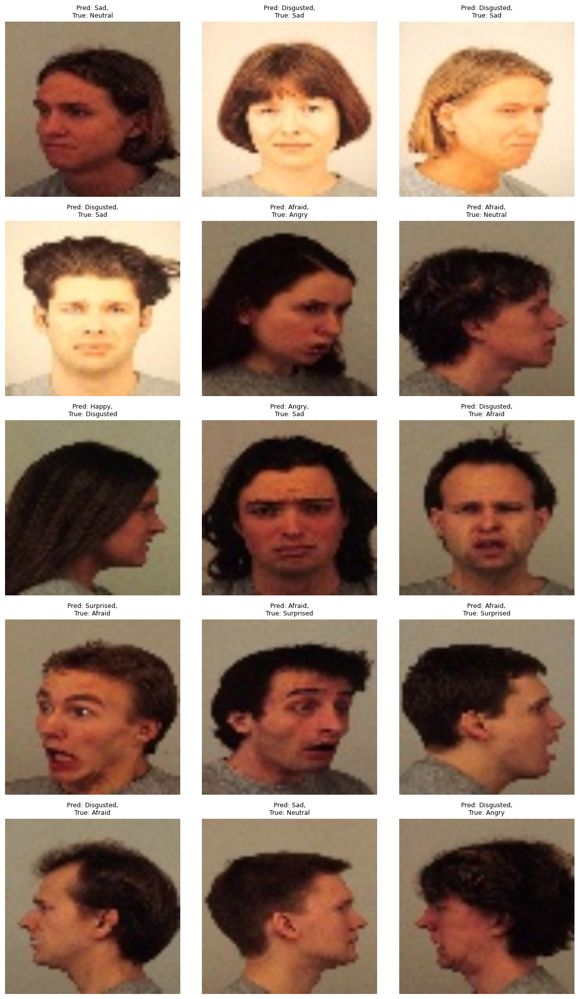




------------------------------------
 Accuracies  [0.8591836734693878, 0.8938775510204082, 0.8469387755102041, 0.8959183673469389, 0.8938775510204082, 0.8714285714285716, 0.8510204081632654]



Epoch 0/19
----------


100%|██████████| 138/138 [00:09<00:00, 14.44it/s]


train Loss: 1.7502 Acc: 0.3075


100%|██████████| 16/16 [00:00<00:00, 20.08it/s]


val Loss: 1.3130 Acc: 0.4918

Epoch 1/19
----------


100%|██████████| 138/138 [00:09<00:00, 14.27it/s]


train Loss: 1.0016 Acc: 0.6295


100%|██████████| 16/16 [00:00<00:00, 19.87it/s]


val Loss: 0.8028 Acc: 0.7000

Epoch 2/19
----------


100%|██████████| 138/138 [00:09<00:00, 14.45it/s]


train Loss: 0.6382 Acc: 0.7737


100%|██████████| 16/16 [00:00<00:00, 19.22it/s]


val Loss: 0.6295 Acc: 0.7694

Epoch 3/19
----------


100%|██████████| 138/138 [00:09<00:00, 14.49it/s]


train Loss: 0.4735 Acc: 0.8329


100%|██████████| 16/16 [00:00<00:00, 19.00it/s]


val Loss: 0.5870 Acc: 0.7796

Epoch 4/19
----------


100%|██████████| 138/138 [00:09<00:00, 14.41it/s]


train Loss: 0.3458 Acc: 0.8830


100%|██████████| 16/16 [00:00<00:00, 20.03it/s]


val Loss: 0.4824 Acc: 0.8286

Epoch 5/19
----------


100%|██████████| 138/138 [00:09<00:00, 14.55it/s]


train Loss: 0.2245 Acc: 0.9399


100%|██████████| 16/16 [00:00<00:00, 19.16it/s]


val Loss: 0.4583 Acc: 0.8327

Epoch 6/19
----------


100%|██████████| 138/138 [00:09<00:00, 14.63it/s]


train Loss: 0.1992 Acc: 0.9454


100%|██████████| 16/16 [00:00<00:00, 19.79it/s]


val Loss: 0.4455 Acc: 0.8408

Epoch 7/19
----------


100%|██████████| 138/138 [00:09<00:00, 14.54it/s]


train Loss: 0.1852 Acc: 0.9519


100%|██████████| 16/16 [00:00<00:00, 17.68it/s]


val Loss: 0.4496 Acc: 0.8408

Epoch 8/19
----------


100%|██████████| 138/138 [00:09<00:00, 14.49it/s]


train Loss: 0.1715 Acc: 0.9596


100%|██████████| 16/16 [00:00<00:00, 20.07it/s]


val Loss: 0.4422 Acc: 0.8367

Epoch 9/19
----------


100%|██████████| 138/138 [00:09<00:00, 14.42it/s]


train Loss: 0.1725 Acc: 0.9540


100%|██████████| 16/16 [00:00<00:00, 20.27it/s]


val Loss: 0.4387 Acc: 0.8469

Epoch 10/19
----------


100%|██████████| 138/138 [00:09<00:00, 14.34it/s]


train Loss: 0.1550 Acc: 0.9624


100%|██████████| 16/16 [00:00<00:00, 19.13it/s]


val Loss: 0.4398 Acc: 0.8408

Epoch 11/19
----------


100%|██████████| 138/138 [00:09<00:00, 14.42it/s]


train Loss: 0.1479 Acc: 0.9649


100%|██████████| 16/16 [00:00<00:00, 19.64it/s]


val Loss: 0.4397 Acc: 0.8449

Epoch 12/19
----------


100%|██████████| 138/138 [00:09<00:00, 14.55it/s]


train Loss: 0.1447 Acc: 0.9649


100%|██████████| 16/16 [00:00<00:00, 18.57it/s]


val Loss: 0.4363 Acc: 0.8388

Epoch 13/19
----------


100%|██████████| 138/138 [00:09<00:00, 14.36it/s]


train Loss: 0.1448 Acc: 0.9653


100%|██████████| 16/16 [00:00<00:00, 18.62it/s]


val Loss: 0.4412 Acc: 0.8449

Epoch 14/19
----------


100%|██████████| 138/138 [00:09<00:00, 14.08it/s]


train Loss: 0.1418 Acc: 0.9673


100%|██████████| 16/16 [00:00<00:00, 19.81it/s]


val Loss: 0.4376 Acc: 0.8327

Epoch 15/19
----------


100%|██████████| 138/138 [00:09<00:00, 14.34it/s]


train Loss: 0.1477 Acc: 0.9655


100%|██████████| 16/16 [00:00<00:00, 19.67it/s]


val Loss: 0.4414 Acc: 0.8429

Epoch 16/19
----------


100%|██████████| 138/138 [00:09<00:00, 14.31it/s]


train Loss: 0.1374 Acc: 0.9703


100%|██████████| 16/16 [00:00<00:00, 18.82it/s]


val Loss: 0.4368 Acc: 0.8490

Epoch 17/19
----------


100%|██████████| 138/138 [00:09<00:00, 14.73it/s]


train Loss: 0.1344 Acc: 0.9712


100%|██████████| 16/16 [00:00<00:00, 18.61it/s]


val Loss: 0.4324 Acc: 0.8429

Epoch 18/19
----------


100%|██████████| 138/138 [00:09<00:00, 14.25it/s]


train Loss: 0.1417 Acc: 0.9678


100%|██████████| 16/16 [00:00<00:00, 18.01it/s]


val Loss: 0.4419 Acc: 0.8408

Epoch 19/19
----------


100%|██████████| 138/138 [00:09<00:00, 14.27it/s]


train Loss: 0.1364 Acc: 0.9705


100%|██████████| 16/16 [00:00<00:00, 19.18it/s]


val Loss: 0.4346 Acc: 0.8388

Training complete in 3m 29s
Best val Acc: 0.848980
Showing misclassified examples for fold 7...


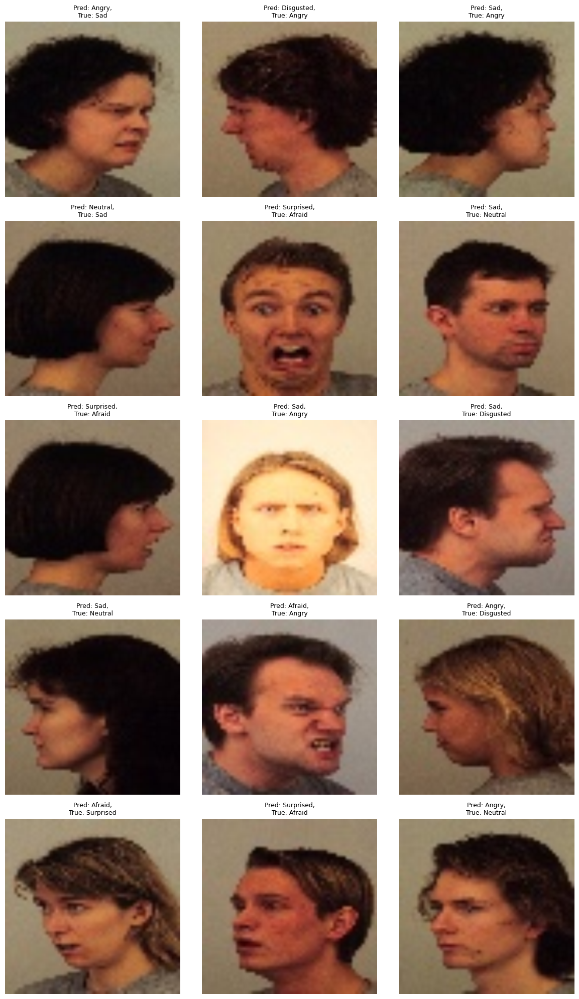




------------------------------------
 Accuracies  [0.8591836734693878, 0.8938775510204082, 0.8469387755102041, 0.8959183673469389, 0.8938775510204082, 0.8714285714285716, 0.8510204081632654, 0.8489795918367348]



Epoch 0/19
----------


100%|██████████| 138/138 [00:09<00:00, 14.60it/s]


train Loss: 1.7290 Acc: 0.3034


100%|██████████| 16/16 [00:00<00:00, 18.15it/s]


val Loss: 1.2571 Acc: 0.5306

Epoch 1/19
----------


100%|██████████| 138/138 [00:09<00:00, 14.47it/s]


train Loss: 0.9861 Acc: 0.6299


100%|██████████| 16/16 [00:00<00:00, 18.56it/s]


val Loss: 0.8699 Acc: 0.6469

Epoch 2/19
----------


100%|██████████| 138/138 [00:09<00:00, 14.34it/s]


train Loss: 0.6485 Acc: 0.7605


100%|██████████| 16/16 [00:00<00:00, 19.74it/s]


val Loss: 0.7571 Acc: 0.7061

Epoch 3/19
----------


100%|██████████| 138/138 [00:09<00:00, 14.53it/s]


train Loss: 0.4706 Acc: 0.8331


100%|██████████| 16/16 [00:00<00:00, 19.69it/s]


val Loss: 0.6276 Acc: 0.7653

Epoch 4/19
----------


100%|██████████| 138/138 [00:09<00:00, 14.46it/s]


train Loss: 0.3513 Acc: 0.8816


100%|██████████| 16/16 [00:00<00:00, 19.26it/s]


val Loss: 0.5504 Acc: 0.7980

Epoch 5/19
----------


100%|██████████| 138/138 [00:09<00:00, 14.51it/s]


train Loss: 0.2308 Acc: 0.9338


100%|██████████| 16/16 [00:00<00:00, 18.24it/s]


val Loss: 0.4624 Acc: 0.8449

Epoch 6/19
----------


100%|██████████| 138/138 [00:09<00:00, 14.45it/s]


train Loss: 0.2043 Acc: 0.9444


100%|██████████| 16/16 [00:00<00:00, 20.16it/s]


val Loss: 0.4457 Acc: 0.8490

Epoch 7/19
----------


100%|██████████| 138/138 [00:09<00:00, 14.46it/s]


train Loss: 0.1891 Acc: 0.9515


100%|██████████| 16/16 [00:00<00:00, 19.01it/s]


val Loss: 0.4347 Acc: 0.8571

Epoch 8/19
----------


100%|██████████| 138/138 [00:09<00:00, 14.33it/s]


train Loss: 0.1708 Acc: 0.9576


100%|██████████| 16/16 [00:00<00:00, 18.78it/s]


val Loss: 0.4275 Acc: 0.8551

Epoch 9/19
----------


100%|██████████| 138/138 [00:09<00:00, 14.47it/s]


train Loss: 0.1725 Acc: 0.9551


100%|██████████| 16/16 [00:00<00:00, 20.21it/s]


val Loss: 0.4302 Acc: 0.8510

Epoch 10/19
----------


100%|██████████| 138/138 [00:09<00:00, 14.09it/s]


train Loss: 0.1599 Acc: 0.9617


100%|██████████| 16/16 [00:00<00:00, 20.02it/s]


val Loss: 0.4240 Acc: 0.8429

Epoch 11/19
----------


100%|██████████| 138/138 [00:09<00:00, 14.77it/s]


train Loss: 0.1510 Acc: 0.9680


100%|██████████| 16/16 [00:00<00:00, 17.65it/s]


val Loss: 0.4222 Acc: 0.8510

Epoch 12/19
----------


100%|██████████| 138/138 [00:09<00:00, 14.71it/s]


train Loss: 0.1487 Acc: 0.9646


100%|██████████| 16/16 [00:00<00:00, 20.25it/s]


val Loss: 0.4201 Acc: 0.8510

Epoch 13/19
----------


100%|██████████| 138/138 [00:09<00:00, 14.78it/s]


train Loss: 0.1435 Acc: 0.9689


100%|██████████| 16/16 [00:00<00:00, 18.98it/s]


val Loss: 0.4215 Acc: 0.8490

Epoch 14/19
----------


100%|██████████| 138/138 [00:09<00:00, 14.62it/s]


train Loss: 0.1448 Acc: 0.9646


100%|██████████| 16/16 [00:00<00:00, 19.66it/s]


val Loss: 0.4171 Acc: 0.8469

Epoch 15/19
----------


100%|██████████| 138/138 [00:09<00:00, 14.55it/s]


train Loss: 0.1493 Acc: 0.9639


100%|██████████| 16/16 [00:00<00:00, 20.12it/s]


val Loss: 0.4199 Acc: 0.8510

Epoch 16/19
----------


100%|██████████| 138/138 [00:09<00:00, 14.51it/s]


train Loss: 0.1442 Acc: 0.9680


100%|██████████| 16/16 [00:00<00:00, 19.05it/s]


val Loss: 0.4207 Acc: 0.8531

Epoch 17/19
----------


100%|██████████| 138/138 [00:09<00:00, 14.46it/s]


train Loss: 0.1456 Acc: 0.9660


100%|██████████| 16/16 [00:00<00:00, 19.25it/s]


val Loss: 0.4220 Acc: 0.8510

Epoch 18/19
----------


100%|██████████| 138/138 [00:09<00:00, 14.83it/s]


train Loss: 0.1400 Acc: 0.9669


100%|██████████| 16/16 [00:00<00:00, 18.89it/s]


val Loss: 0.4185 Acc: 0.8531

Epoch 19/19
----------


100%|██████████| 138/138 [00:09<00:00, 14.29it/s]


train Loss: 0.1505 Acc: 0.9639


100%|██████████| 16/16 [00:00<00:00, 19.92it/s]


val Loss: 0.4211 Acc: 0.8551

Training complete in 3m 28s
Best val Acc: 0.857143
Showing misclassified examples for fold 8...


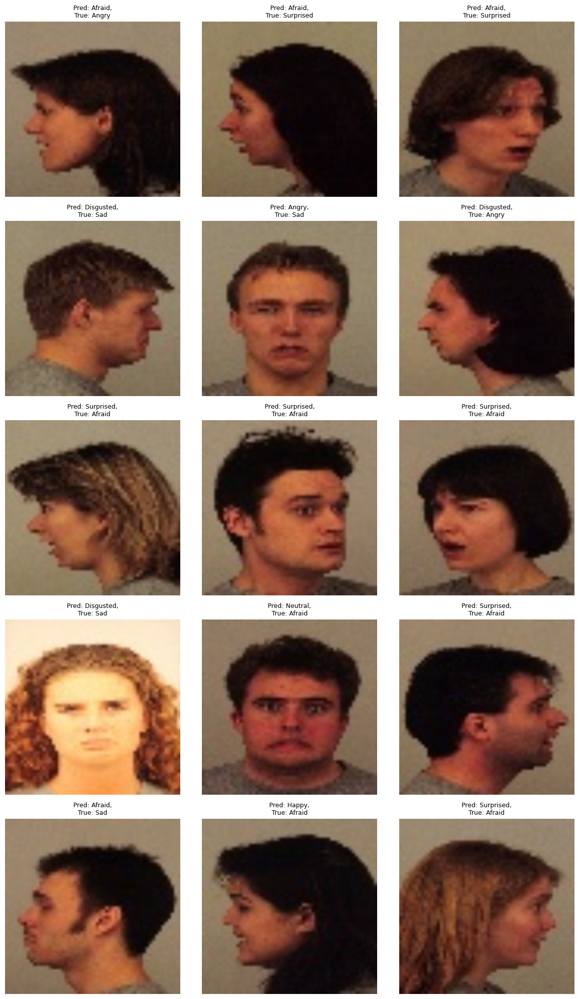




------------------------------------
 Accuracies  [0.8591836734693878, 0.8938775510204082, 0.8469387755102041, 0.8959183673469389, 0.8938775510204082, 0.8714285714285716, 0.8510204081632654, 0.8489795918367348, 0.8571428571428572]



Epoch 0/19
----------


100%|██████████| 138/138 [00:09<00:00, 14.34it/s]


train Loss: 1.6837 Acc: 0.3451


100%|██████████| 16/16 [00:00<00:00, 16.65it/s]


val Loss: 1.2719 Acc: 0.5082

Epoch 1/19
----------


100%|██████████| 138/138 [00:09<00:00, 14.63it/s]


train Loss: 0.9302 Acc: 0.6567


100%|██████████| 16/16 [00:00<00:00, 19.71it/s]


val Loss: 0.8831 Acc: 0.6653

Epoch 2/19
----------


100%|██████████| 138/138 [00:09<00:00, 14.31it/s]


train Loss: 0.6284 Acc: 0.7773


100%|██████████| 16/16 [00:00<00:00, 16.90it/s]


val Loss: 0.7420 Acc: 0.7163

Epoch 3/19
----------


100%|██████████| 138/138 [00:09<00:00, 14.43it/s]


train Loss: 0.4482 Acc: 0.8435


100%|██████████| 16/16 [00:00<00:00, 18.43it/s]


val Loss: 0.6476 Acc: 0.7551

Epoch 4/19
----------


100%|██████████| 138/138 [00:09<00:00, 14.48it/s]


train Loss: 0.3324 Acc: 0.8834


100%|██████████| 16/16 [00:00<00:00, 18.71it/s]


val Loss: 0.5145 Acc: 0.8204

Epoch 5/19
----------


100%|██████████| 138/138 [00:09<00:00, 14.32it/s]


train Loss: 0.2177 Acc: 0.9397


100%|██████████| 16/16 [00:00<00:00, 19.34it/s]


val Loss: 0.4369 Acc: 0.8510

Epoch 6/19
----------


100%|██████████| 138/138 [00:09<00:00, 14.70it/s]


train Loss: 0.1891 Acc: 0.9451


100%|██████████| 16/16 [00:00<00:00, 20.20it/s]


val Loss: 0.4236 Acc: 0.8449

Epoch 7/19
----------


100%|██████████| 138/138 [00:09<00:00, 14.32it/s]


train Loss: 0.1759 Acc: 0.9524


100%|██████████| 16/16 [00:00<00:00, 19.42it/s]


val Loss: 0.4187 Acc: 0.8551

Epoch 8/19
----------


100%|██████████| 138/138 [00:09<00:00, 14.60it/s]


train Loss: 0.1596 Acc: 0.9612


100%|██████████| 16/16 [00:00<00:00, 18.96it/s]


val Loss: 0.4070 Acc: 0.8571

Epoch 9/19
----------


100%|██████████| 138/138 [00:09<00:00, 14.49it/s]


train Loss: 0.1530 Acc: 0.9644


100%|██████████| 16/16 [00:00<00:00, 18.82it/s]


val Loss: 0.4114 Acc: 0.8673

Epoch 10/19
----------


100%|██████████| 138/138 [00:09<00:00, 14.45it/s]


train Loss: 0.1428 Acc: 0.9658


100%|██████████| 16/16 [00:00<00:00, 19.93it/s]


val Loss: 0.4083 Acc: 0.8714

Epoch 11/19
----------


100%|██████████| 138/138 [00:09<00:00, 14.50it/s]


train Loss: 0.1417 Acc: 0.9696


100%|██████████| 16/16 [00:00<00:00, 17.90it/s]


val Loss: 0.3965 Acc: 0.8776

Epoch 12/19
----------


100%|██████████| 138/138 [00:09<00:00, 14.34it/s]


train Loss: 0.1382 Acc: 0.9692


100%|██████████| 16/16 [00:00<00:00, 18.41it/s]


val Loss: 0.3946 Acc: 0.8776

Epoch 13/19
----------


100%|██████████| 138/138 [00:09<00:00, 14.63it/s]


train Loss: 0.1308 Acc: 0.9707


100%|██████████| 16/16 [00:00<00:00, 19.66it/s]


val Loss: 0.4016 Acc: 0.8694

Epoch 14/19
----------


100%|██████████| 138/138 [00:09<00:00, 14.46it/s]


train Loss: 0.1309 Acc: 0.9726


100%|██████████| 16/16 [00:00<00:00, 18.42it/s]


val Loss: 0.3960 Acc: 0.8755

Epoch 15/19
----------


100%|██████████| 138/138 [00:09<00:00, 14.59it/s]


train Loss: 0.1349 Acc: 0.9698


100%|██████████| 16/16 [00:00<00:00, 17.75it/s]


val Loss: 0.3952 Acc: 0.8776

Epoch 16/19
----------


100%|██████████| 138/138 [00:09<00:00, 14.63it/s]


train Loss: 0.1351 Acc: 0.9683


100%|██████████| 16/16 [00:00<00:00, 20.00it/s]


val Loss: 0.3947 Acc: 0.8673

Epoch 17/19
----------


100%|██████████| 138/138 [00:09<00:00, 14.77it/s]


train Loss: 0.1301 Acc: 0.9719


100%|██████████| 16/16 [00:00<00:00, 20.07it/s]


val Loss: 0.3990 Acc: 0.8714

Epoch 18/19
----------


100%|██████████| 138/138 [00:09<00:00, 14.47it/s]


train Loss: 0.1324 Acc: 0.9689


100%|██████████| 16/16 [00:00<00:00, 19.81it/s]


val Loss: 0.3983 Acc: 0.8735

Epoch 19/19
----------


100%|██████████| 138/138 [00:09<00:00, 14.50it/s]


train Loss: 0.1384 Acc: 0.9680


100%|██████████| 16/16 [00:00<00:00, 19.58it/s]


val Loss: 0.3932 Acc: 0.8796

Training complete in 3m 29s
Best val Acc: 0.879592
Showing misclassified examples for fold 9...


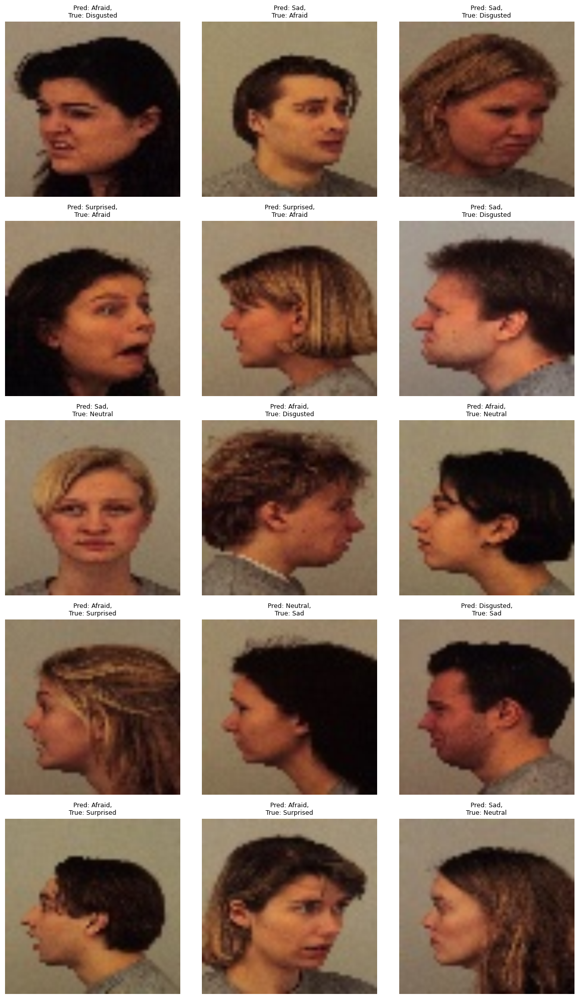




------------------------------------
 Accuracies  [0.8591836734693878, 0.8938775510204082, 0.8469387755102041, 0.8959183673469389, 0.8938775510204082, 0.8714285714285716, 0.8510204081632654, 0.8489795918367348, 0.8571428571428572, 0.879591836734694]





In [11]:
accuracies = []
index = list(np.random.permutation(4900))

for i in range(10):
    idx = {
        'val': index[490 * i:490 * (i + 1)],
        'train': index[:i * 490] + index[((i + 1) * 490):]
    }

    dataloaders = {
        x: torch.utils.data.DataLoader(
            KDEFDataset(transforms_=data_transforms[x], idx=idx[x]),
            batch_size=32,
            shuffle=True
        )
        for x in ['train', 'val']
    }

    model_ft = models.resnet18(weights='IMAGENET1K_V1')
    num_ftrs = model_ft.fc.in_features
    model_ft.fc = nn.Linear(num_ftrs, class_names)
    model_ft = model_ft.to(device)

    criterion = nn.CrossEntropyLoss()
    optimizer_ft = optim.SGD(model_ft.parameters(), lr=0.001, momentum=0.9)
    exp_lr_scheduler = lr_scheduler.StepLR(optimizer_ft, step_size=6, gamma=0.1)

    logdir = f'./logs/resnet18_kfold_{i}'
    os.makedirs(logdir, exist_ok=True)  # Ensure logs dir exists
    writer = SummaryWriter(logdir)

    # 🛠️ ensure "saved" directory exists before saving the model
    os.makedirs('saved', exist_ok=True)

    model_ft, best_acc = train_model(
        model_ft,
        criterion,
        optimizer_ft,
        exp_lr_scheduler,
        dataloaders,
        writer,
        i,
        num_epochs=20
    )

    # Save model
    torch.save(model_ft.state_dict(), f'saved/model_fold_{i}.pt')

    print(f"Showing misclassified examples for fold {i}...")
    visualize_model_misclassified(
    model=model_ft,
    dataloader=dataloaders['val'],
    class_names={
        0: "Afraid", 1: "Angry", 2: "Disgusted",
        3: "Happy", 4: "Neutral", 5: "Sad", 6: "Surprised"
    },
    save_dir=f'misclassified/fold_{i}',
    num_images=15,

)

    accuracies.append(float(best_acc.cpu().numpy()))
    print("\n\n\n------------------------------------\n Accuracies ", accuracies)
    print("\n\n")



In [12]:
from google.colab import files

!zip -r resnet18_56x56_logs_and_saved_misclassified.zip logs saved misclassified
files.download('resnet18_56x56_logs_and_saved_misclassified.zip')

  adding: logs/ (stored 0%)
  adding: logs/resnet18_kfold_3/ (stored 0%)
  adding: logs/resnet18_kfold_3/events.out.tfevents.1744896376.d8d1337140cb (deflated 62%)
  adding: logs/resnet18_kfold_2/ (stored 0%)
  adding: logs/resnet18_kfold_2/events.out.tfevents.1744896165.d8d1337140cb (deflated 62%)
  adding: logs/resnet18_kfold_4/ (stored 0%)
  adding: logs/resnet18_kfold_4/events.out.tfevents.1744896588.d8d1337140cb (deflated 62%)
  adding: logs/resnet18_kfold_6/ (stored 0%)
  adding: logs/resnet18_kfold_6/events.out.tfevents.1744897017.d8d1337140cb (deflated 63%)
  adding: logs/resnet18_kfold_7/ (stored 0%)
  adding: logs/resnet18_kfold_7/events.out.tfevents.1744897230.d8d1337140cb (deflated 62%)
  adding: logs/resnet18_kfold_1/ (stored 0%)
  adding: logs/resnet18_kfold_1/events.out.tfevents.1744895958.d8d1337140cb (deflated 62%)
  adding: logs/resnet18_kfold_5/ (stored 0%)
  adding: logs/resnet18_kfold_5/events.out.tfevents.1744896801.d8d1337140cb (deflated 62%)
  adding: logs/resne

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>